In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from vincenty import vincenty # geopy.distance can also be used

In [2]:
# import pour afficher les cartes
from plotly.offline import iplot, init_notebook_mode
import colorlover as cl
import plotly.express as px
import plotly.graph_objects as go

# init
init_notebook_mode(connected=True)

In [3]:
# load train and test data
df_mess_train = pd.read_csv('mess_train_list.csv')
df_mess_test = pd.read_csv('mess_test_list.csv')
pos_train = pd.read_csv('pos_train_list.csv')

In [4]:
df_mess_train.head()

,messid,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng
0,573bf1d9864fce1a9af8c5c9,2841,473335.0,0.5,-121.5,1.463546e+12,39.617794,-104.954917
1,573bf1d9864fce1a9af8c5c9,3526,473335.0,2.0,-125.0,1.463546e+12,39.677251,-104.952721
2,573bf3533e952e19126b256a,2605,473335.0,1.0,-134.0,1.463547e+12,39.612745,-105.008827
3,573c0cd0f0fe6e735a699b93,2610,473953.0,2.0,-132.0,1.463553e+12,39.797969,-105.073460
4,573c0cd0f0fe6e735a699b93,3574,473953.0,1.0,-120.0,1.463553e+12,39.723151,-104.956216


In [5]:
df_mess_train.describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng
count,39250.000000,3.925000e+04,39250.000000,39250.000000,3.925000e+04,39250.000000,39250.000000
mean,4533.774752,4.835932e+05,1.043541,-125.863580,1.473368e+12,42.554998,-100.969685
std,2570.495638,9.893140e+04,0.563540,9.226500,5.506910e+09,7.722787,11.522732
min,879.000000,4.732880e+05,0.000000,-155.000000,1.463546e+12,36.053394,-107.463146
25%,2790.000000,4.761230e+05,1.000000,-132.500000,1.468410e+12,39.747448,-105.074287
50%,3559.000000,4.763150e+05,1.000000,-127.333333,1.473444e+12,39.793585,-105.043685
75%,7456.000000,4.766090e+05,1.500000,-121.000000,1.479118e+12,39.838740,-104.998429
max,11951.000000,1.747448e+06,2.000000,-64.000000,1.481143e+12,64.300000,-68.500000


In [6]:
pos_train.head()

,lat,lng
0,39.606690,-104.958490
1,39.606690,-104.958490
2,39.637741,-104.958554
3,39.730417,-104.968940
4,39.730417,-104.968940


In [7]:
pos_train.describe()

,lat,lng
count,39250.000000,39250.000000
mean,39.783333,-105.056343
std,0.206262,0.162954
min,35.770683,-107.630679
25%,39.708599,-105.060463
50%,39.776882,-105.039440
75%,39.805279,-105.018730
max,43.140387,-102.094289


In [8]:
df_mess_test.head()

,messid,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng
0,573be2503e952e191262c351,3578,116539.0,2.0,-111.0,1.463542e+12,39.728651,-105.163032
1,573c05f83e952e1912758013,2617,472504.0,0.0,-136.0,1.463551e+12,39.779908,-105.062479
2,573c05f83e952e1912758013,3556,472504.0,0.0,-127.0,1.463551e+12,39.780658,-105.053676
3,573c05f83e952e1912758013,3578,472504.0,0.0,-129.0,1.463551e+12,39.728651,-105.163032
4,573c05f83e952e1912758013,4058,472504.0,0.0,-105.0,1.463551e+12,39.783211,-105.088747


In [9]:
df_mess_train['lat'] = pos_train['lat']
df_mess_train['lng'] = pos_train['lng']

In [12]:
# plot des devices
fig = px.scatter_mapbox(pos_train, lat='lat', lon='lng')

fig.update_layout(mapbox_style="stamen-terrain", mapbox_zoom=8, 
    margin={"r":0,"t":0,"l":0,"b":0})#,height=800)

fig.show()

In [13]:
# plot des stations
fig = px.scatter_mapbox(df_mess_train, lat='bs_lat', lon='bs_lng')

fig.update_layout(mapbox_style="stamen-terrain", mapbox_zoom=5, 
    margin={"r":0,"t":0,"l":0,"b":0})

fig.show()

In [14]:
def vincenty_vec(vec_coord):
    vin_vec_dist = np.zeros(vec_coord.shape[0])
    if vec_coord.shape[1] !=  4:
        print('ERROR: Bad number of columns (shall be = 4)')
    else:
        vin_vec_dist = [vincenty(vec_coord[m,0:2],vec_coord[m,2:]) for m in range(vec_coord.shape[0])]
    return vin_vec_dist

In [15]:
# evaluate distance error for each predicted point
def Eval_geoloc(y_train_lat , y_train_lng, y_pred_lat, y_pred_lng):
    vec_coord = np.array([y_train_lat , y_train_lng, y_pred_lat, y_pred_lng])
    err_vec = vincenty_vec(np.transpose(vec_coord))
    
    return err_vec

In [16]:
# on rajoute distance device-station dans df_mess_train
df_mess_train['d_base'] = Eval_geoloc(df_mess_train['bs_lat'],df_mess_train['bs_lng'],pos_train['lat'],pos_train['lng'])

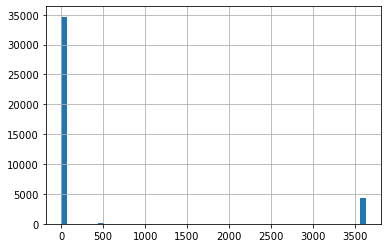

In [17]:
df_mess_train['d_base'].hist(bins=50);

In [18]:
df_mess_train[df_mess_train['d_base'] > 3000].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,4389.000000,4.389000e+03,4389.000000,4389.000000,4.389000e+03,4.389000e+03,4389.0,4389.000000,4389.000000,4389.000000
mean,6144.622465,4.986286e+05,1.038847,-125.300828,1.476081e+12,6.430000e+01,-68.5,39.759422,-105.029877,3610.630498
std,3451.227827,1.690960e+05,0.601033,9.230369,4.015779e+09,5.272828e-12,0.0,0.072178,0.051676,5.226358
min,1092.000000,4.732880e+05,0.000000,-142.000000,1.466007e+12,6.430000e+01,-68.5,39.537137,-107.066221,3438.203097
25%,2707.000000,4.741810e+05,1.000000,-132.000000,1.472799e+12,6.430000e+01,-68.5,39.707218,-105.047845,3608.263507
50%,4993.000000,4.763150e+05,1.000000,-127.000000,1.477406e+12,6.430000e+01,-68.5,39.773364,-105.028769,3609.547659
75%,10151.000000,4.768290e+05,1.500000,-120.500000,1.479316e+12,6.430000e+01,-68.5,39.792541,-105.018591,3615.239933
max,11951.000000,1.747448e+06,2.000000,-69.333333,1.481140e+12,6.430000e+01,-68.5,42.452279,-104.921795,3628.655909


In [36]:
n1 = len(df_mess_train[df_mess_train['d_base'] > 3000])
n = len(df_mess_train)
print(f"il y a {n1} ({n1/n*100:.1f}%) lignes avec d > 3000 km", )

il y a 4389 (11.2%) lignes avec d > 3000 km


In [18]:
df_mess_train.loc[df_mess_train['d_base'] > 3000,'bsid'].value_counts()

10162    597
4993     488
8355     480
10151    333
1594     290
11007    275
1796     249
4129     216
8451     193
2707     191
1743     169
1661     160
4987     147
4156     127
1772     121
8560     116
2943      90
8449      72
1092      32
1854      27
7248       9
2293       2
4123       1
9784       1
4959       1
11951      1
10999      1
Name: bsid, dtype: int64

In [38]:
bs_outliers = df_mess_train.loc[df_mess_train['d_base'] > 3000,'bsid'].unique()
bs_outliers

array([ 8355, 11007,  1594, 10151, 10162,  8451,  4993,  8560,  2293,
        4959, 10999,  1661,  8449,  4156,  4129,  1743,  4987,  1772,
        1796,  2707,  2943,  4123, 11951,  9784,  1092,  1854,  7248],
      dtype=int64)

In [39]:
df_mess_train[df_mess_train['bsid'].isin(bs_outliers)].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,4389.000000,4.389000e+03,4389.000000,4389.000000,4.389000e+03,4.389000e+03,4389.0,4389.000000,4389.000000,4389.000000
mean,6144.622465,4.986286e+05,1.038847,-125.300828,1.476081e+12,6.430000e+01,-68.5,39.759422,-105.029877,3610.630498
std,3451.227827,1.690960e+05,0.601033,9.230369,4.015779e+09,5.272828e-12,0.0,0.072178,0.051676,5.226358
min,1092.000000,4.732880e+05,0.000000,-142.000000,1.466007e+12,6.430000e+01,-68.5,39.537137,-107.066221,3438.203097
25%,2707.000000,4.741810e+05,1.000000,-132.000000,1.472799e+12,6.430000e+01,-68.5,39.707218,-105.047845,3608.263507
50%,4993.000000,4.763150e+05,1.000000,-127.000000,1.477406e+12,6.430000e+01,-68.5,39.773364,-105.028769,3609.547659
75%,10151.000000,4.768290e+05,1.500000,-120.500000,1.479316e+12,6.430000e+01,-68.5,39.792541,-105.018591,3615.239933
max,11951.000000,1.747448e+06,2.000000,-69.333333,1.481140e+12,6.430000e+01,-68.5,42.452279,-104.921795,3628.655909


In [40]:
df_mess_train_filter = df_mess_train.loc[df_mess_train['d_base'] < 3000,:]

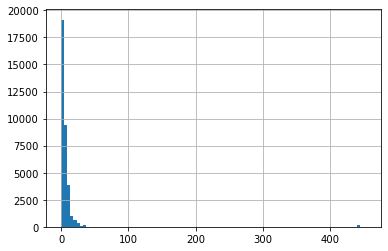

In [41]:
df_mess_train_filter['d_base'].hist(bins=100);

In [42]:
df_mess_train_filter[df_mess_train_filter['d_base'] > 300].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,178.000000,178.0,178.000000,178.000000,1.780000e+02,178.000000,178.000000,1.780000e+02,1.780000e+02,178.000000
mean,3298.651685,473288.0,1.028090,-133.426966,1.479273e+12,43.635597,-103.758906,3.977454e+01,-1.050393e+02,441.877720
std,606.930577,0.0,0.595935,4.910272,1.761786e+07,0.049272,0.032814,1.353839e-13,3.705245e-13,5.184176
min,1443.000000,473288.0,0.000000,-143.000000,1.479240e+12,43.065924,-103.831941,3.977454e+01,-1.050393e+02,379.214848
25%,2803.000000,473288.0,0.500000,-137.000000,1.479259e+12,43.614138,-103.784275,3.977454e+01,-1.050393e+02,440.280842
50%,2808.000000,473288.0,1.000000,-135.000000,1.479275e+12,43.639226,-103.761023,3.977454e+01,-1.050393e+02,442.213973
75%,3848.000000,473288.0,1.500000,-131.000000,1.479288e+12,43.657379,-103.723449,3.977454e+01,-1.050393e+02,444.218083
max,7508.000000,473288.0,2.000000,-109.000000,1.479302e+12,43.725754,-103.671045,3.977454e+01,-1.050393e+02,453.352103


In [43]:
bs_300 = df_mess_train_filter.loc[df_mess_train_filter['d_base'] > 300,'bsid'].unique()
bs_300

array([7508, 3848, 2803, 2808, 3630, 2800, 3933, 3501, 4013, 1443],
      dtype=int64)

In [44]:
df_mess_train_filter[df_mess_train_filter['bsid'].isin(bs_300)].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,178.000000,178.0,178.000000,178.000000,1.780000e+02,178.000000,178.000000,1.780000e+02,1.780000e+02,178.000000
mean,3298.651685,473288.0,1.028090,-133.426966,1.479273e+12,43.635597,-103.758906,3.977454e+01,-1.050393e+02,441.877720
std,606.930577,0.0,0.595935,4.910272,1.761786e+07,0.049272,0.032814,1.353839e-13,3.705245e-13,5.184176
min,1443.000000,473288.0,0.000000,-143.000000,1.479240e+12,43.065924,-103.831941,3.977454e+01,-1.050393e+02,379.214848
25%,2803.000000,473288.0,0.500000,-137.000000,1.479259e+12,43.614138,-103.784275,3.977454e+01,-1.050393e+02,440.280842
50%,2808.000000,473288.0,1.000000,-135.000000,1.479275e+12,43.639226,-103.761023,3.977454e+01,-1.050393e+02,442.213973
75%,3848.000000,473288.0,1.500000,-131.000000,1.479288e+12,43.657379,-103.723449,3.977454e+01,-1.050393e+02,444.218083
max,7508.000000,473288.0,2.000000,-109.000000,1.479302e+12,43.725754,-103.671045,3.977454e+01,-1.050393e+02,453.352103


In [45]:
df_mess_train_filter[df_mess_train_filter['did'] == 473288].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,299.000000,299.0,299.000000,299.000000,2.990000e+02,299.000000,299.000000,299.000000,299.000000,299.000000
mean,4082.685619,473288.0,1.016722,-129.794872,1.479251e+12,42.069789,-104.264196,39.774567,-105.039345,264.836540
std,1880.035146,0.0,0.605945,7.500081,3.126943e+07,1.902748,0.614802,0.000122,0.000027,215.129932
min,1443.000000,473288.0,0.000000,-148.000000,1.479205e+12,39.704887,-105.090762,39.774541,-105.039537,0.678365
25%,2803.000000,473288.0,0.500000,-135.500000,1.479220e+12,39.761633,-105.000917,39.774541,-105.039339,4.226438
50%,3630.000000,473288.0,1.000000,-131.000000,1.479251e+12,43.614138,-103.790401,39.774541,-105.039339,440.280842
75%,3933.000000,473288.0,1.500000,-125.000000,1.479277e+12,43.657077,-103.756890,39.774541,-105.039339,443.600632
max,8474.000000,473288.0,2.000000,-101.000000,1.479302e+12,43.725754,-103.671045,39.775428,-105.039339,453.352103


In [46]:
df_300 = df_mess_train_filter[df_mess_train_filter['bsid'].isin(bs_300)]

In [49]:
fig = px.scatter_mapbox(df_300, lat='lat', lon='lng')
fig.update_traces(marker_color='green')

fig.add_scattermapbox(lat=df_300['bs_lat'], lon=df_300['bs_lng'])
fig.update_traces( marker={'size':10})

fig.update_layout(mapbox_style="stamen-terrain", mapbox_zoom=5, 
    margin={"r":0,"t":0,"l":0,"b":0})#, height=800)

fig.show()

In [50]:
df_mess_train_filter2 = df_mess_train_filter[df_mess_train_filter['d_base'] < 300]

In [51]:
df_mess_train_filter2.describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,34683.000000,3.468300e+04,34683.000000,34683.000000,3.468300e+04,34683.000000,34683.000000,34683.000000,34683.000000,34683.000000
mean,4336.267076,4.817434e+05,1.044215,-125.895977,1.472995e+12,39.797706,-105.064284,39.786404,-105.059779,5.659976
std,2365.047086,8.617427e+04,0.558458,9.225012,5.570426e+09,0.218678,0.179139,0.217727,0.172078,6.060786
min,879.000000,4.732880e+05,0.000000,-155.000000,1.463546e+12,36.053394,-107.463146,35.770683,-107.630679,0.026570
25%,2790.000000,4.761850e+05,1.000000,-132.500000,1.467914e+12,39.743521,-105.077825,39.708726,-105.063607,2.017537
50%,3554.000000,4.763150e+05,1.000000,-127.500000,1.472820e+12,39.781464,-105.050984,39.777579,-105.041876,3.990627
75%,4790.000000,4.766060e+05,1.500000,-121.000000,1.478647e+12,39.816224,-105.010048,39.807167,-105.018742,7.524622
max,10148.000000,1.747448e+06,2.000000,-64.000000,1.481143e+12,42.850670,-102.011461,43.140387,-102.094289,246.941592


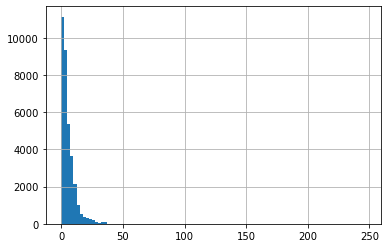

In [52]:
df_mess_train_filter2['d_base'].hist(bins=100);

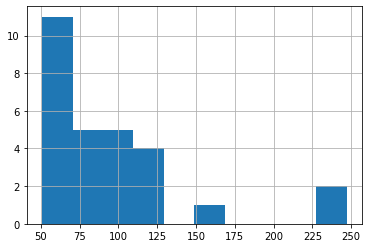

In [53]:
df_mess_train_filter2.loc[df_mess_train_filter2['d_base'] > 50,'d_base'].hist();

In [54]:
df_mess_train_filter2[df_mess_train_filter2['d_base'] > 50].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,28.000000,28.000000,28.000000,28.000000,2.800000e+01,28.000000,28.000000,28.000000,28.000000,28.000000
mean,4030.000000,476519.714286,0.875000,-133.345238,1.472170e+12,39.325840,-104.768366,39.765196,-105.023069,94.972494
std,3073.399987,474.230594,0.502309,5.757609,2.664138e+09,1.132029,0.880681,0.941455,0.705174,48.513809
min,944.000000,474192.000000,0.000000,-143.000000,1.471060e+12,36.555938,-106.526314,36.105738,-107.050011,50.939388
25%,1447.000000,476609.000000,0.500000,-136.250000,1.471067e+12,38.779555,-105.297999,39.776925,-105.018648,62.379971
50%,2814.500000,476609.000000,1.000000,-135.000000,1.471067e+12,39.154474,-104.759367,39.776925,-105.018648,80.907561
75%,7683.250000,476609.000000,1.000000,-130.250000,1.471071e+12,39.753647,-104.390249,39.776925,-105.018648,107.691354
max,10148.000000,476889.000000,2.000000,-122.000000,1.479924e+12,42.041404,-102.548384,42.452279,-102.345049,246.941592


In [55]:
df_mess_train_filter2[(df_mess_train_filter2['did']== 476609) & (df_mess_train_filter2['d_base'] > 50)].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,20.00000,20.0,20.000000,20.000000,2.000000e+01,20.000000,20.000000,20.000000,20.000000,20.000000
mean,4660.40000,476609.0,0.825000,-131.683333,1.471067e+12,39.033094,-104.657865,39.776913,-105.018634,103.521478
std,3114.50267,0.0,0.406364,5.856695,1.674591e+06,0.477348,0.656898,0.000056,0.000059,54.272798
min,980.00000,476609.0,0.000000,-143.000000,1.471060e+12,37.963785,-105.824406,39.776674,-105.018648,50.972723
25%,1840.00000,476609.0,0.875000,-135.000000,1.471067e+12,38.779555,-104.897032,39.776925,-105.018648,67.020344
50%,3597.50000,476609.0,1.000000,-134.500000,1.471067e+12,39.018877,-104.759367,39.776925,-105.018648,95.159105
75%,7851.00000,476609.0,1.000000,-126.750000,1.471067e+12,39.297401,-104.360831,39.776925,-105.018648,112.440174
max,10148.00000,476609.0,1.500000,-122.000000,1.471067e+12,39.767081,-103.046812,39.776925,-105.018384,246.941592


In [56]:
df_mess_train_filter2[(df_mess_train_filter2['did']== 476609) & (df_mess_train_filter2['d_base'] > 50)
                     ].sort_values('d_base')

,messid,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
14295,57aeb41fe541cd77a044cdb8,4055,476609.0,1.0,-132.000000,1.471067e+12,39.332583,-104.869457,39.776925,-105.018648,50.972723
14265,57aeb41fe541cd77a044cdb8,2849,476609.0,0.0,-135.000000,1.471067e+12,39.749169,-105.656036,39.776925,-105.018648,54.703493
14259,57aeb41fe541cd77a044cdb8,2780,476609.0,1.0,-135.000000,1.471067e+12,39.267888,-104.867256,39.776925,-105.018648,57.995906
14254,57aeb41fe541cd77a044cdb8,2611,476609.0,1.0,-127.333333,1.471067e+12,39.285674,-105.256414,39.776925,-105.018648,58.246378
14318,57aeb41fe541cd77a044cdb8,8242,476609.0,1.0,-125.000000,1.471067e+12,39.508230,-104.399440,39.776925,-105.018648,60.950884
14329,57aeb41fe541cd77a044cdb8,8442,476609.0,1.0,-143.000000,1.471067e+12,39.767081,-105.824406,39.776925,-105.018648,69.043498
14250,57aeb41fe541cd77a044cdb8,1971,476609.0,1.0,-124.000000,1.471067e+12,39.160211,-104.834460,39.776925,-105.018648,70.280893
14312,57aeb41fe541cd77a044cdb8,7628,476609.0,1.0,-139.000000,1.471067e+12,39.601859,-104.149483,39.776925,-105.018648,77.048177
14314,57aeb41fe541cd77a044cdb8,7857,476609.0,1.0,-122.000000,1.471067e+12,39.148737,-104.594997,39.776925,-105.018648,78.698591
14238,57aeb41fe541cd77a044cdb8,980,476609.0,1.0,-122.333333,1.471067e+12,38.997730,-104.684275,39.776925,-105.018648,91.178482


In [57]:
dev_476609_1 = df_mess_train_filter2[(df_mess_train_filter2['did']== 476609) &
                                     (df_mess_train_filter2['d_base'] <= 50)]
dev_476609_2 = df_mess_train_filter2[(df_mess_train_filter2['did']== 476609) &
                                     (df_mess_train_filter2['d_base'] > 50)]

In [58]:
fig = px.scatter_mapbox(dev_476609_1, lat='lat', lon='lng')
fig.update_traces(marker_color='green')

fig.add_scattermapbox(lat=dev_476609_2['lat'], lon=dev_476609_2['lng'])
fig.update_traces( marker={'size':10})

fig.update_layout(mapbox_style="stamen-terrain", mapbox_zoom=8, 
    margin={"r":0,"t":0,"l":0,"b":0})#, height=800)

fig.show()

In [59]:
df = df_mess_train_filter2[(df_mess_train_filter2['did']== 476609) ].sort_values('time_ux')

In [60]:
fig = px.scatter(df,x='time_ux',y='d_base')
fig.show()

In [61]:
df2 = df[(df['time_ux']>1.47105e12) & (df['time_ux']<1.4712e12) ]
fig = px.scatter(df2,x='time_ux',y='d_base')
fig.show()

In [62]:
df[(df['time_ux']>1.471067e12) & (df['time_ux']<1.471068e12) ].describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,95.000000,95.0,95.000000,95.000000,9.500000e+01,95.000000,95.000000,9.500000e+01,9.500000e+01,95.000000
mean,4635.147368,476609.0,0.889474,-123.652632,1.471067e+12,39.581920,-104.972877,3.977693e+01,-1.050186e+02,30.684484
std,2546.232360,0.0,0.426384,11.219855,0.000000e+00,0.353187,0.353513,5.714498e-14,2.857249e-14,44.789520
min,980.000000,476609.0,0.000000,-143.000000,1.471067e+12,37.963785,-105.824406,3.977693e+01,-1.050186e+02,0.966970
25%,2843.500000,476609.0,0.500000,-133.500000,1.471067e+12,39.600337,-105.087259,3.977693e+01,-1.050186e+02,5.195473
50%,3570.000000,476609.0,1.000000,-126.000000,1.471067e+12,39.718120,-105.040763,3.977693e+01,-1.050186e+02,13.432565
75%,7738.500000,476609.0,1.000000,-116.750000,1.471067e+12,39.759461,-104.930206,3.977693e+01,-1.050186e+02,33.864360
max,10148.000000,476609.0,2.000000,-96.333333,1.471067e+12,39.965284,-103.046812,3.977693e+01,-1.050186e+02,246.941592


In [63]:
df[(df['time_ux']>1.471067e12) & (df['time_ux']<1.471068e12) ].describe(include='object')

,messid
count,95
unique,1
top,57aeb41fe541cd77a044cdb8
freq,95


In [64]:
df_mess_train_filter2[(df_mess_train_filter2['messid']!= '57aeb41fe541cd77a044cdb8')
                      & (df_mess_train_filter2['d_base'] > 50)]

,messid,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
14171,57ae96de12f143459150217b,1447,476609.0,1.0,-135.0,1.471060e+12,38.773072,-104.843971,39.776674,-105.018384,112.432506
14380,57aebb7fe541cd77a049cb6a,1235,476327.0,1.0,-139.0,1.471069e+12,39.928055,-104.553341,39.534877,-104.859559,50.939388
14397,57aed427e541cd77a05a9b32,1463,476327.0,1.0,-139.0,1.471075e+12,40.220047,-105.422754,39.564460,-104.861642,87.187326
16605,57c1578ae541cd77a05f9fe2,8405,476315.0,0.5,-142.0,1.472289e+12,40.573332,-104.412158,39.735399,-105.026208,106.741836
19226,57cf8d1412f1437531f4a714,1148,476835.0,2.0,-138.0,1.473220e+12,36.555938,-102.548384,36.105738,-102.345049,53.187929
19254,57cfb297cf554f22dcee7424,1730,476598.0,0.0,-133.0,1.473229e+12,38.153534,-104.584520,38.812551,-104.306977,77.058526
28701,5822df26cf554f7e3aa2e56e,2855,474192.0,1.0,-136.0,1.478680e+12,42.041404,-106.526314,42.452279,-107.050011,62.856334
34463,5835da9ce541cd03e70b29a7,944,476889.0,2.0,-137.0,1.479924e+12,41.424900,-106.143919,40.840967,-105.911902,67.712411
34464,5835da9ce541cd03e70b29a7,1852,476889.0,0.5,-136.0,1.479924e+12,41.564439,-106.165570,40.840967,-105.911902,83.116532


In [65]:
len(df_mess_train_filter2[(df_mess_train_filter2['messid']== '57aeb41fe541cd77a044cdb8')])

95

In [66]:
df_mess_train_filter3 = df_mess_train_filter2[(df_mess_train_filter2['messid']!= '57aeb41fe541cd77a044cdb8')
                      & (df_mess_train_filter2['d_base'] <= 50)]
df_mess_train_filter3.describe()

,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng,lat,lng,d_base
count,34579.000000,3.457900e+04,34579.000000,34579.000000,3.457900e+04,34579.000000,34579.000000,34579.000000,34579.000000,34579.000000
mean,4335.964979,4.817589e+05,1.044651,-125.899192,1.473000e+12,39.798268,-105.064546,39.786442,-105.059899,5.572419
std,2364.338923,8.630330e+04,0.558705,9.217687,5.577516e+09,0.216214,0.177424,0.216460,0.171193,5.309702
min,879.000000,4.732880e+05,0.000000,-155.000000,1.463546e+12,36.053394,-107.463146,35.770683,-107.630679,0.026570
25%,2790.000000,4.761850e+05,1.000000,-132.500000,1.467906e+12,39.744848,-105.077530,39.708524,-105.063613,2.013047
50%,3554.000000,4.763150e+05,1.000000,-127.500000,1.472830e+12,39.781464,-105.050984,39.777623,-105.042091,3.983613
75%,4790.000000,4.766020e+05,1.500000,-121.000000,1.478673e+12,39.816224,-105.010048,39.807485,-105.018761,7.496166
max,10148.000000,1.747448e+06,2.000000,-64.000000,1.481143e+12,42.850670,-102.011461,43.140387,-102.094289,47.237609


In [67]:
len(df_mess_train) - len(df_mess_train_filter3)

4671

In [68]:
4671 -4389 -178 -95

9

In [69]:
(len(df_mess_train) - len(df_mess_train_filter3))/len(df_mess_train)

0.1190063694267516

In [70]:
fig = px.scatter(df_mess_train_filter3,x='rssi',y='d_base')
fig.update_traces( marker={'opacity':0.1})
fig.show()

In [71]:
fig = px.density_heatmap(df_mess_train_filter3,x='rssi',y='d_base')
fig.show()

In [72]:
fig = px.scatter(df_mess_train_filter3,x='rssi',y='d_base',trendline="lowess")
fig.update_traces( marker={'size':3,'opacity':0.3})
fig.show()

In [50]:
listOfDev = df_mess_train['did'].unique()
len(listOfDev)

113

In [49]:
listOfBs = np.union1d(np.unique(df_mess_train['bsid']), np.unique(df_mess_test['bsid'])) # determine all Base stations that received at least 1 message

In [50]:
len(listOfBs)

259

In [51]:
df_mess_bs_group = df_mess_train.groupby(['messid'], as_index=False)

In [52]:
df_mess_bs_group.get_group('573d681d864fce1a9ad29b41')['bsid'].head()

180    1741
181    1878
182    1987
183    1988
184    1994
Name: bsid, dtype: int64

In [53]:
nb_mess = len(np.unique(df_mess_train['messid']))
df_feat = pd.DataFrame(np.zeros((nb_mess,len(listOfBs))), columns = listOfBs)

In [54]:
df_feat.loc[0,df_mess_bs_group.get_group('573d681d864fce1a9ad29b41')['bsid']] = df_mess_bs_group.get_group('573d681d864fce1a9ad29b41')['rssi'].values

In [55]:
df_feat.loc[0,df_mess_bs_group.get_group('573d681d864fce1a9ad29b41')['bsid']]

1741   -108.333333
1878   -115.666667
1987   -120.333333
1988   -135.000000
1994   -131.333333
1996   -105.000000
2189   -125.000000
2610   -133.500000
2790   -115.000000
2799   -135.000000
3412   -129.500000
3415   -138.000000
3536   -136.000000
3538   -125.666667
3554   -135.000000
3558   -135.000000
3562   -119.666667
3576   -127.000000
3579   -124.000000
4058   -128.000000
4157   -116.000000
8446   -130.000000
8470   -126.000000
8475   -127.000000
8509   -139.000000
Name: 0, dtype: float64

In [19]:
# Feature Matrix construction 

def feat_mat_const(df_mess_train, listOfBs):

    df_mess_bs_group = df_mess_train.groupby(['messid'], as_index=False) # group data by message (messid)
    nb_mess = len(np.unique(df_mess_train['messid']))
    df_feat = pd.DataFrame(np.zeros((nb_mess,len(listOfBs))), columns = listOfBs) # feature matrix
    idx = 0
    id_list = [0] * nb_mess

    for key, elmt in df_mess_bs_group:
        df_mess_bs_group.get_group(key)
        df_feat.loc[idx,df_mess_bs_group.get_group(key)['bsid']] = 1
        id_list[idx] = key
        idx = idx + 1
    
    return df_feat, id_list # add id value of each message for the correspondance to message  

In [220]:
# Feature Matrix construction 

def feat_mat_const2(df_mess_train, listOfBs):

    df_mess_bs_group = df_mess_train.groupby(['messid'], as_index=False) # group data by message (messid)
    nb_mess = len(np.unique(df_mess_train['messid']))
    df_feat = pd.DataFrame(np.zeros((nb_mess,len(listOfBs))), columns = listOfBs) # feature matrix
    idx = 0
    id_list = [0] * nb_mess

    for key, elmt in df_mess_bs_group:
        group = df_mess_bs_group.get_group(key)
        df_feat.loc[idx,group['bsid']] = group['rssi'].values
        id_list[idx] = key
        idx = idx + 1
    
    return df_feat, id_list # add id value of each message for the correspondance to message  

In [221]:
# ground truth construction

def ground_truth_const(df_mess_train, pos_train):

    df_mess_pos = df_mess_train.copy()
    df_mess_pos[['lat', 'lng']] = pos_train

    ground_truth_lat = np.array(df_mess_pos.groupby(['messid']).mean()['lat'])
    ground_truth_lng = np.array(df_mess_pos.groupby(['messid']).mean()['lng'])
    
    return ground_truth_lat, ground_truth_lng

In [245]:
df_feat, id_list_train = feat_mat_const(df_mess_train, listOfBs)
df_feat.head()

,879,911,921,944,980,1012,1086,1092,1120,1131,...,9936,9941,9949,10134,10148,10151,10162,10999,11007,11951
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [222]:
df_feat2, id_list_train2 = feat_mat_const2(df_mess_train, listOfBs)
df_feat2.head()

,879,911,921,944,980,1012,1086,1092,1120,1131,...,9936,9941,9949,10134,10148,10151,10162,10999,11007,11951
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,-141.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [223]:
ground_truth_lat, ground_truth_lng = ground_truth_const(df_mess_train, pos_train)
ground_truth_lat.shape

(6068,)

In [224]:
# Validation

In [225]:
def regressor_and_predict(df_feat, ground_truth_lat, ground_truth_lng, df_test):
    
    # train regressor and make prediction in the train set
    # Input: df_feat: feature matrix used to train regressor
    #        ground_truth_lat: df_feat associated latitude
    #        ground_truth_lng: df_feat associated longitude
    #        df_test: data frame used for prediction
    # Output: y_pred_lat, y_pred_lng

    from sklearn import linear_model

    X_train = np.array(df_feat);
    reg = linear_model.LinearRegression()

    reg.fit(X_train, ground_truth_lat);
    y_pred_lat = reg.predict(df_test) 

    reg.fit(X_train, ground_truth_lng);
    y_pred_lng = reg.predict(df_test) 
    
    return y_pred_lat, y_pred_lng


In [226]:
# Make regressor and prediction using the train set

In [227]:
y_pred_lat, y_pred_lng = regressor_and_predict(df_feat2, ground_truth_lat, ground_truth_lng, df_feat2)

In [228]:
# Cross validation

In [229]:
from sklearn.model_selection import cross_val_predict

In [230]:
df_feat = df_feat2

In [246]:
from sklearn import linear_model
reg = linear_model.LinearRegression()
y_pred_lng = cross_val_predict(reg, df_feat, ground_truth_lng, cv=10)
y_pred_lat = cross_val_predict(reg, df_feat, ground_truth_lat, cv=10)

In [254]:
from sklearn.ensemble import RandomForestRegressor
reg = RandomForestRegressor()
y_pred_lng = cross_val_predict(reg, df_feat, ground_truth_lng, cv=10)
y_pred_lat = cross_val_predict(reg, df_feat, ground_truth_lat, cv=10)

In [232]:
y_pred_lat[y_pred_lat < -80] = ground_truth_lat.min()
y_pred_lat[y_pred_lat > 80] = ground_truth_lat.max()
y_pred_lng[y_pred_lng < -170] = ground_truth_lng.min()
y_pred_lng[y_pred_lng > 170] = ground_truth_lng.max()

In [234]:
# Evaluate result

In [237]:
ground_truth_lat.shape

(6068,)

In [37]:
np.array([ground_truth_lat , ground_truth_lng, y_pred_lat, y_pred_lng]).shape

(4, 6068)

In [247]:
err_vec = Eval_geoloc(ground_truth_lat , ground_truth_lng, y_pred_lat, y_pred_lng)

In [248]:
y_pred_lat[5774]

4028095413.165681

In [249]:
y_pred_lng[5774]

-4158655639.17028

In [250]:
err_vec[5774]

7839.526782

In [251]:
# Plot error distribution

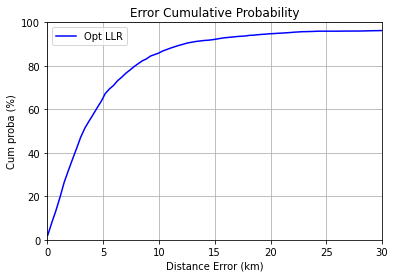

In [252]:
values, base = np.histogram(err_vec, bins=50000)
cumulative = np.cumsum(values) 
plt.figure();
plt.plot(base[:-1], cumulative / np.float(np.sum(values))  * 100.0, c='blue')
plt.grid(); plt.xlabel('Distance Error (km)'); plt.ylabel('Cum proba (%)'); plt.axis([0, 30, 0, 100]); 
plt.title('Error Cumulative Probability'); plt.legend( ["Opt LLR", "LLR 95", "LLR 99"])

In [244]:
# Error criterion

np.percentile(err_vec, 80)

8.810193400000003

In [25]:
# Construct test prediction

In [44]:
df_mess_test.head()

,messid,bsid,did,nseq,rssi,time_ux,bs_lat,bs_lng
0,573be2503e952e191262c351,3578,116539.0,2.0,-111.0,1.463542e+12,39.728651,-105.163032
1,573c05f83e952e1912758013,2617,472504.0,0.0,-136.0,1.463551e+12,39.779908,-105.062479
2,573c05f83e952e1912758013,3556,472504.0,0.0,-127.0,1.463551e+12,39.780658,-105.053676
3,573c05f83e952e1912758013,3578,472504.0,0.0,-129.0,1.463551e+12,39.728651,-105.163032
4,573c05f83e952e1912758013,4058,472504.0,0.0,-105.0,1.463551e+12,39.783211,-105.088747


In [45]:
df_feat_test, id_list_test = feat_mat_const(df_mess_test, listOfBs)

In [46]:
y_pred_lat, y_pred_lng = regressor_and_predict(df_feat, ground_truth_lat, ground_truth_lng, df_feat_test)

In [47]:
test_res = pd.DataFrame(np.array([y_pred_lat, y_pred_lng]).T, columns = ['lat', 'lng'])
test_res['messid'] = id_list_test

In [30]:
test_res.to_csv('pred_pos_test_list.csv', index=False)

In [48]:
test_res.head()

,lat,lng,messid
0,39.772912,-105.049629,573be2503e952e191262c351
1,39.774800,-105.062448,573c05f83e952e1912758013
2,39.678750,-105.012794,573c0796f0fe6e735a66deb3
3,39.773684,-105.037449,573c08d2864fce1a9a0563bc
4,39.678750,-105.012794,573c08ff864fce1a9a0579b0
